In [1]:
import os
import re
import numpy as np
from skimage import transform
from scipy.ndimage import gaussian_filter
import cv2
from matplotlib import pyplot as plt
import matplotlib as mpl
plt.set_cmap('gray')
import pandas as pd
from typing import Callable
# %matplotlib widget
plt.rcParams["figure.figsize"] = [10, 7];
folderCan = '../imgs/can/'  
paths = [
    os.path.join(folderCan, re.fullmatch("frame\d\d\.jpg", p).string)
    for p in os.listdir(folderCan)
    if re.fullmatch("frame\d\d\.jpg", p)
]
folderMan = '../imgs/Man/'  
pathsMan = [
    os.path.join(folderMan, re.fullmatch("\d\d\d\d\.jpg", p).string)
    for p in os.listdir(folderMan)
    if re.fullmatch("\d\d\d\d\.jpg", p)
]

<Figure size 640x480 with 0 Axes>

(-0.5, 684.5, 493.5, -0.5)

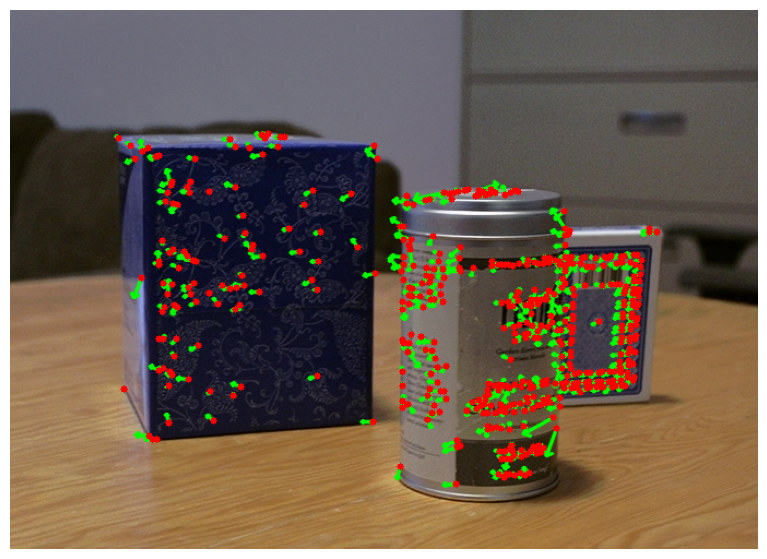

In [2]:
def drawVectorFlow(img, keypoints,flowVectors,size = 2 ,scaleFactor=5):
    img = img.copy()
    A = [(int(round(x)),int(round(y))) for (x,y) in keypoints]
    B = [(int(round(x)),int(round(y))) for (x,y) in keypoints+scaleFactor*flowVectors]
    for (x1, y1), (x2, y2) in zip(A,B):
        img = cv2.arrowedLine(img, (x1, y1), (x2, y2),(0, 255, 0), size,cv2.LINE_AA,0,0.2)
    return img
def drawKeypoints(img, keypoints, size=3):
    img = img.copy()
    keypoints = [(int(round(x)),int(round(y))) for (x,y) in keypoints.copy()]
    for point in keypoints:
        img = cv2.circle(img,point,size,(255,0,0),-1)
    return img
def createWindow(x, y, window_size):
    x = int(round(x))
    y = int(round(y))
    win_half_size = window_size//2
    return tuple([slice(y-win_half_size,y+win_half_size + (1 if window_size%2 == 1 else 0)),
                  slice(x-win_half_size,x+win_half_size + (1 if window_size%2 == 1 else 0))])
def lucasKanade(img1, img2, keypoints, winSize, errThr):
    img1 = img1/255
    img1 = gaussian_filter(img1, 1, mode='mirror')
    img2 = img2/255
    img2 = gaussian_filter(img2, 1, mode='mirror')
    flowVectors = np.zeros_like(keypoints, dtype=np.float64)
    validPoints = np.ones(len(keypoints), dtype=bool)
    
    # Calculate spatial gradient of img1
    Iy, Ix = np.gradient(img1)

    for i, (x_old, y_old) in enumerate(keypoints):       
        # Define the search window around the keypoint
        winIndex = createWindow(x_old, y_old, winSize)
        win1 = img1[winIndex]
        win2 = img2[winIndex]

        # Compute A and b matrices for least squares solution
        win_Ix = Ix[winIndex]
        win_Iy = Iy[winIndex]
        win_It = win2 - win1
        A = np.c_[win_Ix.ravel(), win_Iy.ravel()]
        b = -win_It.ravel()
        
        # # Solve least squares problem to get flow vector
        flowVectors[i] = np.linalg.lstsq(A, b, rcond=None)[0]
        u, v  = flowVectors[i]
        # Calculate temporal gradient between img1 and img2
        x_new = x_old + u
        y_new = y_old + v
        
        winOld3 = createWindow(x_old, y_old, 3)
        winNew3 = createWindow(x_new, y_new, 3)
        oldPosition = img1[winOld3]
        oldPosition = oldPosition/oldPosition.sum()
        newPosition = img1[winNew3]
        newPosition = newPosition/newPosition.sum()
        if np.abs(u)> winSize/2 or np.abs(v)> winSize/2:
            validPoints[i] = False
        if np.mean((oldPosition - newPosition)**2) > errThr:
            validPoints[i] = False         
    return flowVectors, validPoints 

winSize = 5
canImg1 = cv2.imread(paths[0], cv2.IMREAD_GRAYSCALE)  
keypointImgRGB = cv2.cvtColor(cv2.imread(paths[0], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
# p0 = cv2.goodFeaturesToTrack(canImg1,maxCorners=canImg1.size, qualityLevel=0.1,minDistance=3)
keypoints = cv2.goodFeaturesToTrack(canImg1,maxCorners=canImg1.size, qualityLevel=0.1,minDistance=3)
keypoints = np.squeeze(keypoints).astype(np.int64)

canImg2 = cv2.imread(paths[1], cv2.IMREAD_GRAYSCALE)  
flowVectors, validPoints = lucasKanade(canImg1, canImg2, keypoints, winSize, 0)
keypointImgRGB = drawVectorFlow(keypointImgRGB, keypoints,flowVectors)
keypointImgRGB = drawKeypoints(keypointImgRGB, keypoints)
plt.figure()
plt.imshow(keypointImgRGB)
plt.axis("off")
# lk_params = dict( winSize  = (3, 3),
#                   maxLevel = 0,
#                   criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 3, 0.3))
# p1, st, err = cv2.calcOpticalFlowPyrLK(canImg1, canImg2, p0, None, **lk_params)
# trueFlow = np.round(np.squeeze(p1-p0)).astype(np.int32)
# keypointImgRGB = cv2.cvtColor(cv2.imread(paths[0], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
# keypointImgRGB = drawVectorFlow(keypointImgRGB, keypoints,trueFlow)
# keypointImgRGB = drawKeypoints(keypointImgRGB, keypoints)
# plt.figure()
# plt.imshow(keypointImgRGB)
# plt.axis("off")
# print('done')

# flow = registration.optical_flow_tvl1(canImg1,canImg2,num_warp=20,num_iter=1,prefilter=False,dtype=np.float64)
# trueFlow = flow[:,keypoints[:,1],keypoints[:,0]][::-1].T
# keypointImgRGB = cv2.cvtColor(cv2.imread(paths[0], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
# keypointImgRGB = drawVectorFlow(keypointImgRGB, keypoints,trueFlow)
# keypointImgRGB = drawKeypoints(keypointImgRGB, keypoints)
# plt.figure()
# plt.imshow(keypointImgRGB)
# plt.axis("off")
# print('done')

Optimal threshold = 0.0004893900918477494


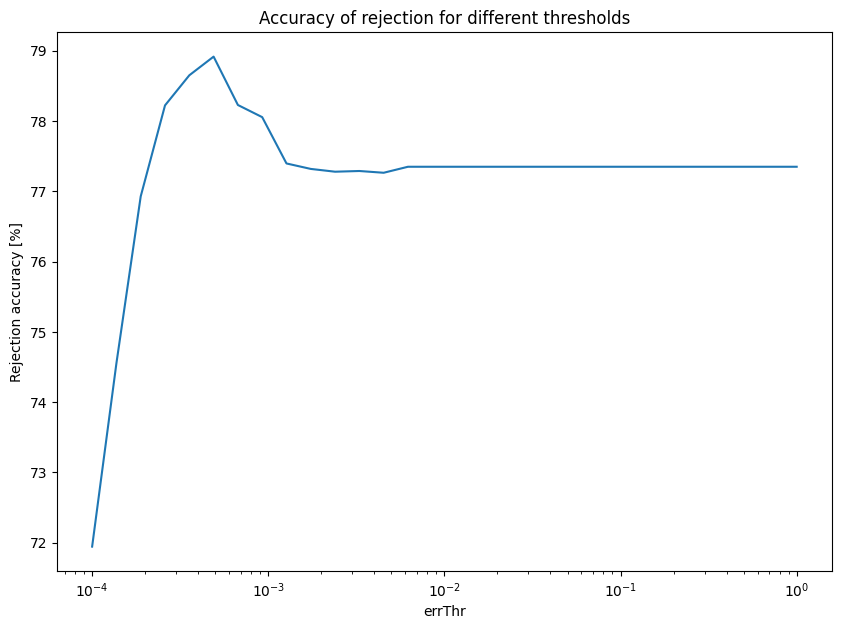

In [6]:
winSize = 5
rejectionAccuracy = []
errThrSpace = np.logspace(-4,0,30,base=10)
lk_params = dict( winSize  = (5, 5),
                  maxLevel = 4,
                  criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.3))
angleThreshold = 15
for errThr in errThrSpace :
    nRejected = 0
    nTrueRejected = 0
    canImg1 = cv2.imread(paths[0], cv2.IMREAD_GRAYSCALE) 
    p0 = cv2.goodFeaturesToTrack(canImg1,maxCorners=canImg1.size, qualityLevel=0.1,minDistance=3)
    keypoints = np.squeeze(p0).astype(np.int64)
    for path in paths[1:]:
        canImg2 = cv2.imread(path, cv2.IMREAD_GRAYSCALE)  
        flowVectors, validPoints = lucasKanade(canImg1, canImg2, keypoints, winSize, errThr)
        p1, st, err = cv2.calcOpticalFlowPyrLK(canImg1, canImg2, p0, None, **lk_params)
        st = np.squeeze(st)
        trueFlowVectors = np.squeeze(p1-p0)
        flowVectorsAngles = np.arctan2(flowVectors[:,1],flowVectors[:,0])
        trueFlowVectorsAngles = np.arctan2(trueFlowVectors[:,1],trueFlowVectors[:,0])
        badFlow = np.abs(flowVectorsAngles-trueFlowVectorsAngles)>(angleThreshold)/180*np.pi
        if st.ndim == 0:
            st = np.atleast_1d(st)
        # Select good points
        if p1 is not None:
            good_new = p1[st==1]
        nRejected += np.sum(np.logical_not(validPoints))

        nTrueRejected += np.sum(badFlow[np.logical_not(validPoints)])
        p0 = good_new.reshape(-1, 1, 2)
        keypoints = good_new.reshape(-1, 2).astype(np.int64)
        canImg1 = canImg2
    rejectionAccuracy.append(nTrueRejected/nRejected * 100)
plt.plot(errThrSpace,rejectionAccuracy)
ax = plt.gca()
ax.set_xscale('log')
ax.set_xlabel('errThr')
ax.set_ylabel('Rejection accuracy [%]')
ax.set_title('Accuracy of rejection for different thresholds')
errThr = errThrSpace[np.argmax(rejectionAccuracy)]
print(f'Optimal threshold = {errThr}')

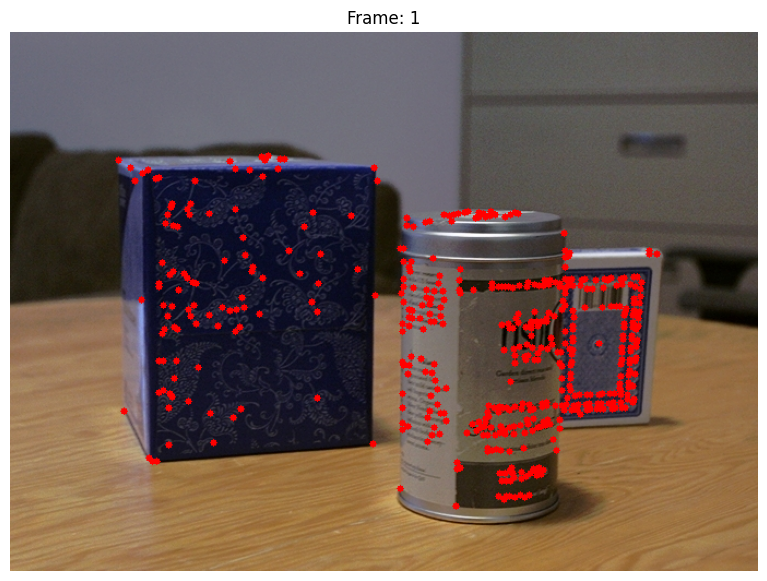

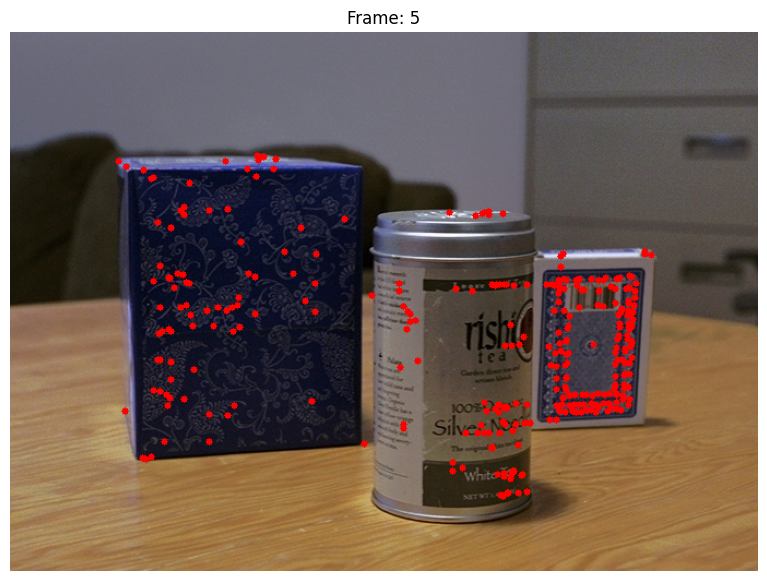

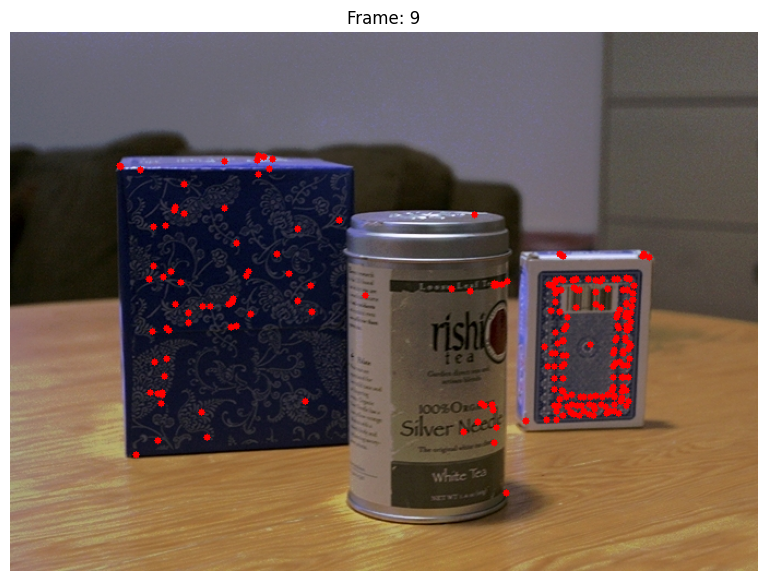

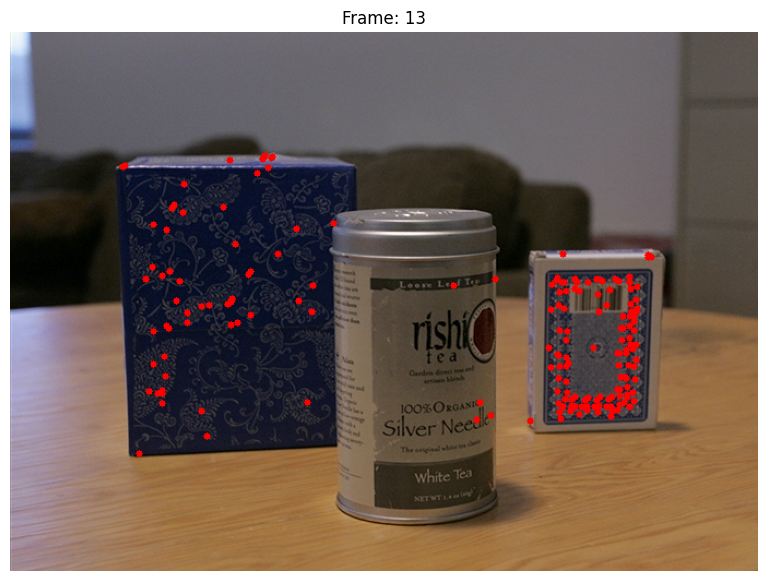

In [96]:
os.makedirs('CanLK/',exist_ok=True)
canImg1 = cv2.imread(paths[0], cv2.IMREAD_GRAYSCALE)
keypoints = cv2.goodFeaturesToTrack(canImg1,maxCorners=canImg1.size, qualityLevel=0.1,minDistance=3)
keypoints = np.squeeze(keypoints).astype(np.int64)
for currentPath,nextPath in zip(paths[:-1],paths[1:]):
    savePath = os.path.join('CanLK/',os.path.basename(currentPath))
    currentFrame = int(os.path.basename(currentPath)[5:7])
    canImg2 = cv2.imread(nextPath, cv2.IMREAD_GRAYSCALE)
    flowVectors, validPoints = lucasKanade(canImg1, canImg2, keypoints, winSize, errThr)
    keypointImgRGB = cv2.cvtColor(cv2.imread(currentPath, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
    keypointImgRGB = drawKeypoints(keypointImgRGB, keypoints)
    cv2.imwrite(savePath,cv2.cvtColor(keypointImgRGB, cv2.COLOR_RGB2BGR))
    if currentFrame in [1,5,9]:
        plt.figure()
        plt.imshow(keypointImgRGB)
        plt.axis("off")
        plt.title(f'Frame: {currentFrame}')
    canImg1 = canImg2
    keypointImgRGB = cv2.cvtColor(cv2.imread(path, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
    keypoints = np.round(keypoints[validPoints] + flowVectors[validPoints]).astype(np.int64)
# Save the last frame keypoints to disk
currentFrame = int(os.path.basename(paths[-1])[5:7])
savePath = os.path.join('CanLK/',os.path.basename(paths[-1]))
keypointImgRGB = cv2.cvtColor(cv2.imread(paths[-1], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
keypointImgRGB = drawKeypoints(keypointImgRGB, keypoints)
cv2.imwrite(savePath,cv2.cvtColor(keypointImgRGB, cv2.COLOR_RGB2BGR))
plt.figure()
plt.imshow(keypointImgRGB)
plt.axis("off")
plt.title(f'Frame: {currentFrame}');

done


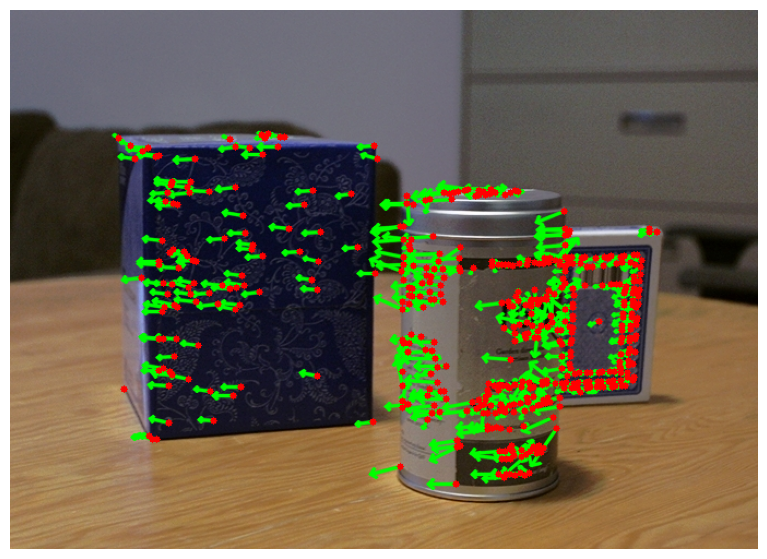

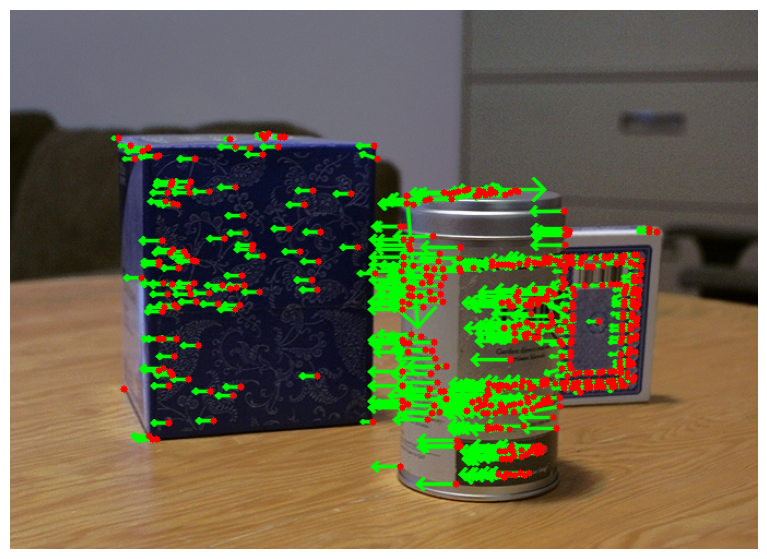

In [97]:
def lucasKanadeIter(img1, img2, keypoints, winSize, numIter, initFlow, errThr):
    img1 = img1/255
    img1 = gaussian_filter(img1,1, mode='mirror')
    img2 = img2/255
    img2 = gaussian_filter(img2,1, mode='mirror')
    flowVectors = initFlow.copy()
    validPoints = np.ones(len(keypoints), dtype=bool)
    
    # Calculate spatial gradient of img1
    Iy, Ix = np.gradient(img1)
    
    for i, (x_old, y_old) in enumerate(keypoints):
        u, v  = flowVectors[i]
        # Calculate temporal gradient between img1 and img2
        x_new = x_old + u
        y_new = y_old + v
        # Define the search window around the keypoint
        winIndex1 = createWindow(x_old, y_old, winSize)      
        win1 = img1[winIndex1]

        win_Ix = Ix[winIndex1]
        win_Iy = Iy[winIndex1]
        # Iteratively find better optical flow estimation
        for _ in range(numIter):
            winIndex2 = createWindow(x_new, y_new, winSize)
            win2 = img2[winIndex2]
            # Compute A and b matrices for least squares solution
            win_It = (win2 - win1)
            A = np.c_[win_Ix.ravel(), win_Iy.ravel()]
            b = -win_It.ravel()
            
            # # Solve least squares problem to get flow vector
            flowVectors[i] += np.linalg.lstsq(A, b, rcond=None)[0]
            u, v  = flowVectors[i]
            # Calculate temporal gradient between img1 and img2
            x_new = x_old + u
            y_new = y_old + v
            dist = np.sqrt(u**2 + v**2)
            if  dist < 0.1:
                break
            if np.abs(u)> winSize/2 or np.abs(v)> winSize/2:
                validPoints[i] = False
                break   
        winOld3 = createWindow(x_old, y_old, 3)
        winNew3 = createWindow(x_new, y_new, 3)
        oldPosition = img1[winOld3]
        oldPosition = oldPosition/oldPosition.sum()
        newPosition = img1[winNew3]
        newPosition = newPosition/newPosition.sum()

        if np.mean((oldPosition - newPosition)**2) > errThr:
            validPoints[i] = False
            # break

    return flowVectors, validPoints
winSize = 9
numIter = 7
canImg1 = cv2.imread(paths[0], cv2.IMREAD_GRAYSCALE)  
keypointImgRGB = cv2.cvtColor(cv2.imread(paths[0], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
keypoints = cv2.goodFeaturesToTrack(canImg1,maxCorners=canImg1.size, qualityLevel=0.1,minDistance=3)
p0 = cv2.goodFeaturesToTrack(canImg1,maxCorners=canImg1.size, qualityLevel=0.1,minDistance=3)
keypoints = np.squeeze(keypoints).astype(np.int64)
initFlow = np.zeros_like(keypoints,dtype=np.float64)

canImg2 = cv2.imread(paths[1], cv2.IMREAD_GRAYSCALE)  
flowVectors, validPoints = lucasKanadeIter(canImg1, canImg2, keypoints, winSize,numIter,initFlow, errThr)
# flowVectors = flowVectors*validPoints[:, np.newaxis]
keypointImgRGB = drawVectorFlow(keypointImgRGB, keypoints,flowVectors)
keypointImgRGB = drawKeypoints(keypointImgRGB, keypoints)
plt.figure()
plt.imshow(keypointImgRGB)
plt.axis("off")
lk_params = dict( winSize  = (9, 9),
                  maxLevel = 2,
                  criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 7, 0.3))
p1, st, err = cv2.calcOpticalFlowPyrLK(canImg1, canImg2, p0, None, **lk_params)
trueFlow = np.round(np.squeeze(p1-p0)).astype(np.int32)
keypointImgRGB = cv2.cvtColor(cv2.imread(paths[0], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
keypointImgRGB = drawVectorFlow(keypointImgRGB, keypoints,trueFlow)
keypointImgRGB = drawKeypoints(keypointImgRGB, keypoints)
plt.figure()
plt.imshow(keypointImgRGB)
plt.axis("off")
print('done')

# flow = registration.optical_flow_tvl1(canImg1,canImg2,num_warp=20,num_iter=1,prefilter=False,dtype=np.float64)
# trueFlow = flow[:,keypoints[:,1],keypoints[:,0]][::-1].T
# keypointImgRGB = cv2.cvtColor(cv2.imread(paths[0], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
# keypointImgRGB = drawVectorFlow(keypointImgRGB, keypoints,trueFlow)
# keypointImgRGB = drawKeypoints(keypointImgRGB, keypoints)
# plt.figure()
# plt.imshow(keypointImgRGB)
# plt.axis("off")
# print('done')

Optimal threshold = 0.000774263682681127


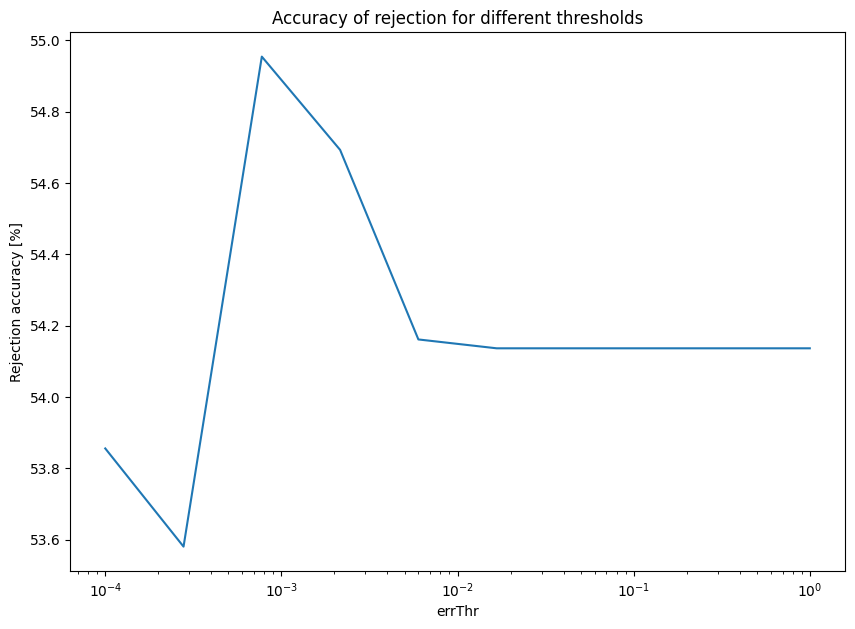

In [9]:
winSize = 9
numIter = 7
rejectionAccuracy = []
errThrSpace = np.logspace(-4,0,10,base=10)
lk_params = dict( winSize  = (5, 5),
                  maxLevel = 4,
                  criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.3))
angleThreshold = 15
for errThr in errThrSpace :
    nRejected = 0
    nTrueRejected = 0
    canImg1 = cv2.imread(paths[0], cv2.IMREAD_GRAYSCALE) 
    p0 = cv2.goodFeaturesToTrack(canImg1,maxCorners=canImg1.size, qualityLevel=0.1,minDistance=3)
    keypoints = np.squeeze(p0).astype(np.int64)
    for path in paths[1:]:
        canImg2 = cv2.imread(path, cv2.IMREAD_GRAYSCALE)  
        initFlow = np.zeros_like(keypoints,dtype=np.float64)
        flowVectors, validPoints = lucasKanadeIter(canImg1, canImg2, keypoints, winSize, numIter,initFlow, errThr)
        p1, st, err = cv2.calcOpticalFlowPyrLK(canImg1, canImg2, p0, None, **lk_params)
        st = np.squeeze(st)
        trueFlowVectors = np.squeeze(p1-p0)
        flowVectorsAngles = np.arctan2(flowVectors[:,1],flowVectors[:,0])
        trueFlowVectorsAngles = np.arctan2(trueFlowVectors[:,1],trueFlowVectors[:,0])
        badFlow = np.abs(flowVectorsAngles-trueFlowVectorsAngles)>(angleThreshold)/180*np.pi
        if st.ndim == 0:
            st = np.atleast_1d(st)
        # Select good points
        if p1 is not None:
            good_new = p1[st==1]
        nRejected += np.sum(np.logical_not(validPoints))
        nTrueRejected += np.sum(badFlow[np.logical_not(validPoints)])
        p0 = good_new.reshape(-1, 1, 2)
        keypoints = good_new.reshape(-1, 2).astype(np.int64)
        canImg1 = canImg2
    rejectionAccuracy.append(nTrueRejected/nRejected * 100)
plt.plot(errThrSpace,rejectionAccuracy)
ax = plt.gca()
ax.set_xscale('log')
ax.set_xlabel('errThr')
ax.set_ylabel('Rejection accuracy [%]')
ax.set_title('Accuracy of rejection for different thresholds')
errThr = errThrSpace[np.argmax(rejectionAccuracy)]
print(f'Optimal threshold = {errThr}')

Text(0.5, 1.0, 'Frame: 13')

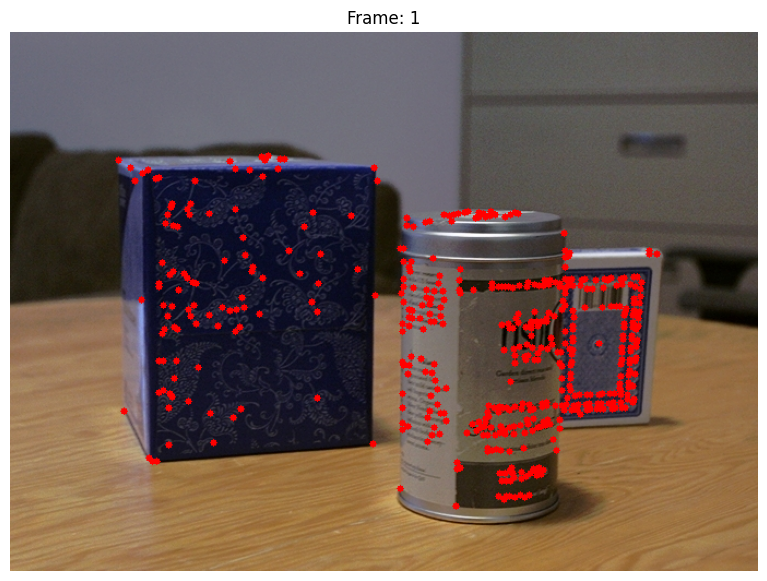

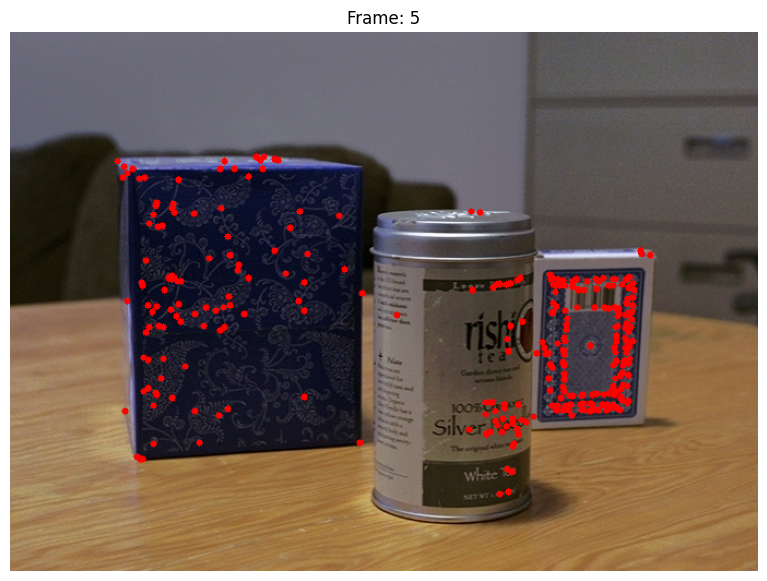

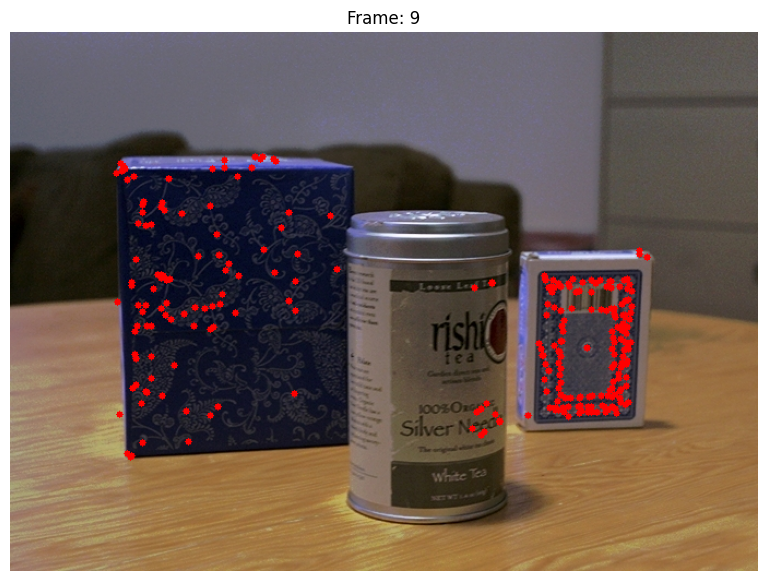

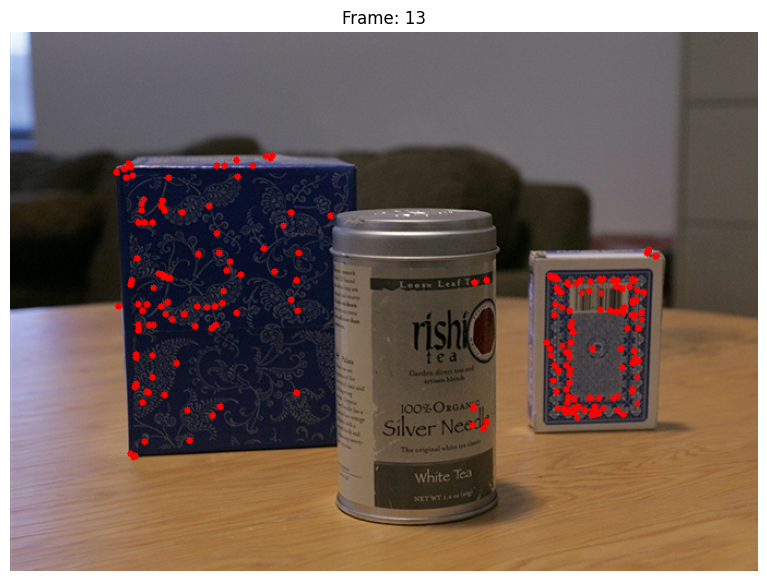

In [99]:
os.makedirs('CanLKiter/',exist_ok=True)
canImg1 = cv2.imread(paths[0], cv2.IMREAD_GRAYSCALE)
keypoints = cv2.goodFeaturesToTrack(canImg1,maxCorners=canImg1.size, qualityLevel=0.1,minDistance=3)
keypoints = np.squeeze(keypoints).astype(np.int64)
initFlow = np.zeros_like(keypoints,np.float64)
for currentPath,nextPath in zip(paths[:-1],paths[1:]):
    savePath = os.path.join('CanLKiter/',os.path.basename(currentPath))
    currentFrame = int(os.path.basename(currentPath)[5:7])
    canImg2 = cv2.imread(nextPath, cv2.IMREAD_GRAYSCALE)
    flowVectors, validPoints = lucasKanadeIter(canImg1, canImg2, keypoints, winSize,numIter,initFlow, errThr)
    keypointImgRGB = cv2.cvtColor(cv2.imread(currentPath, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
    keypointImgRGB = drawKeypoints(keypointImgRGB, keypoints)
    cv2.imwrite(savePath,cv2.cvtColor(keypointImgRGB, cv2.COLOR_RGB2BGR))
    if currentFrame in [1,5,9]:
        plt.figure()
        plt.imshow(keypointImgRGB)
        plt.axis("off")
        plt.title(f'Frame: {currentFrame}')
    # plt.imshow(keypointImgRGB)
    canImg1 = canImg2
    keypointImgRGB = cv2.cvtColor(cv2.imread(path, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
    keypoints = np.round(keypoints[validPoints] + flowVectors[validPoints]).astype(np.int64)
    initFlow = np.zeros_like(keypoints,np.float64)
currentFrame = int(os.path.basename(paths[-1])[5:7])
savePath = os.path.join('CanLKiter/',os.path.basename(paths[-1]))
keypointImgRGB = cv2.cvtColor(cv2.imread(paths[-1], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
keypointImgRGB = drawKeypoints(keypointImgRGB, keypoints)
cv2.imwrite(savePath,cv2.cvtColor(keypointImgRGB, cv2.COLOR_RGB2BGR))
plt.figure()
plt.imshow(keypointImgRGB)
plt.axis("off")
plt.title(f'Frame: {currentFrame}')

done


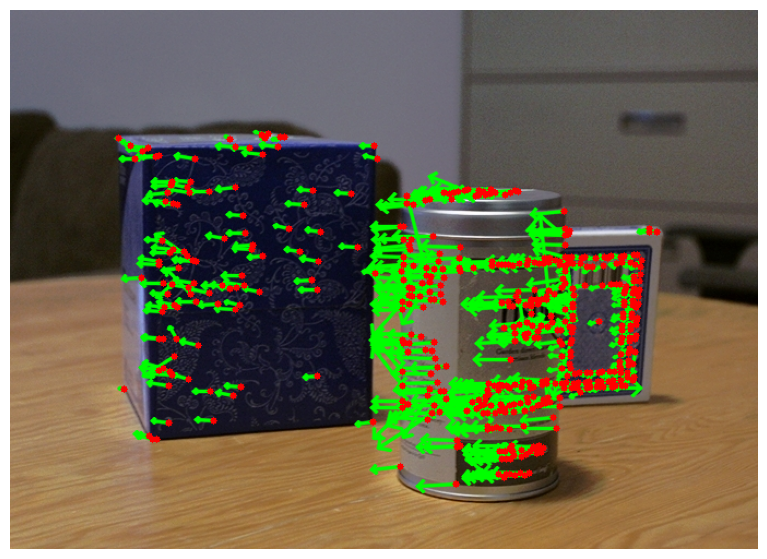

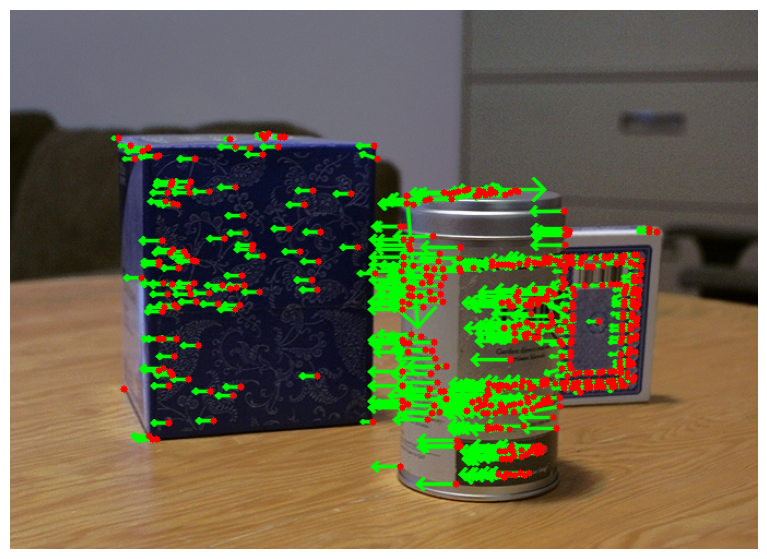

In [3]:
def pyrLucasKanade(img1, img2, keypoints, winSize, numIter, levelNum, levelScale, errThr):
    img1 = img1/255
    # img1 = gaussian_filter(img1,1, mode='mirror')
    img2 = img2/255
    # img2 = gaussian_filter(img2,1, mode='mirror')
    flowVectors = np.zeros_like(keypoints, dtype=np.float32)
    validPoints = np.ones(len(keypoints), dtype=bool)
    
    if levelNum > 0:
        levelNum -= 1
    pyramid1 = list(transform.pyramid_gaussian(img1, max_layer=levelNum, downscale=levelScale))[::-1]
    pyramid2 = list(transform.pyramid_gaussian(img2, max_layer=levelNum, downscale=levelScale))[::-1]
    prevShape = np.array(pyramid1[0].shape[::-1])
    ratio = (np.array(pyramid1[0].shape[::-1])/np.array(pyramid1[-1].shape[::-1]))
    keypoints = keypoints * ratio
    # winSize = int(round(winSize*np.mean(ratio)))
    for img1, img2 in zip(pyramid1,pyramid2):

        currentShape = np.array(img1.shape[::-1])
        # Calculate spatial gradient of img1
        Iy, Ix = np.gradient(img1)
        flowVectors = flowVectors * (currentShape/prevShape)
        # winSize = int(round(winSize/np.mean((currentShape/prevShape))))
        keypoints = keypoints * (currentShape/prevShape)
        for i, (x_old, y_old) in enumerate(keypoints):
            if not validPoints[i]:
                continue
            u, v  = flowVectors[i]
            # Calculate temporal gradient between img1 and img2
            x_new = x_old + u
            y_new = y_old + v
            # Define the search window around the keypoint
            winIndex1 = createWindow(x_old, y_old, winSize)      
            win1 = img1[winIndex1]

            win_Ix = Ix[winIndex1]
            win_Iy = Iy[winIndex1]
            # Iteratively find better optical flow estimation
            for _ in range(numIter):
                winIndex2 = createWindow(x_new, y_new, winSize)
                win2 = img2[winIndex2]
                if win1.shape != win2.shape:
                    # validPoints[i] = False
                    break
                # Compute A and b matrices for least squares solution
                win_It = (win2 - win1)
                A = np.c_[win_Ix.ravel(), win_Iy.ravel()]
                b = -win_It.ravel()
                
                # # Solve least squares problem to get flow vector
                flowVectors[i] += np.linalg.lstsq(A, b, rcond=None)[0]
                u, v  = flowVectors[i]
                # Calculate temporal gradient between img1 and img2
                x_new = x_old + u
                y_new = y_old + v
                dist = np.sqrt(u**2 + v**2)
                if  dist < 0.1:
                    break

        # pyramidFlowVectors = flowVectors
        prevShape = currentShape
    for i, (x_old, y_old) in enumerate(keypoints):
        u, v  = flowVectors[i]
        x_new = x_old + u
        y_new = y_old + v
        if np.abs(u)> ((winSize//2) / ratio[0]) or np.abs(v)> ((winSize//2) / ratio[1]):
            validPoints[i] = False 
        winOld3 = createWindow(x_old, y_old, 3)
        winNew3 = createWindow(x_new, y_new, 3)
        oldPosition = img1[winOld3]
        oldPosition = oldPosition/oldPosition.sum()
        newPosition = img1[winNew3]
        newPosition = newPosition/newPosition.sum()
        if oldPosition.shape != newPosition.shape:
            validPoints[i] = False
            continue
        if np.mean((oldPosition - newPosition)**2) > errThr:
            validPoints[i] = False
        # break
        
    return flowVectors, validPoints
winSize = 9
numIter = 7
levelNum = 3
levelScale = 2
errThr  = 1
canImg1 = cv2.imread(paths[0], cv2.IMREAD_GRAYSCALE)  
keypointImgRGB = cv2.cvtColor(cv2.imread(paths[0], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
keypoints = cv2.goodFeaturesToTrack(canImg1,maxCorners=canImg1.size, qualityLevel=0.1,minDistance=3)
p0 = cv2.goodFeaturesToTrack(canImg1,maxCorners=canImg1.size, qualityLevel=0.1,minDistance=3)
keypoints = np.squeeze(keypoints).astype(np.int64)
initFlow = np.zeros_like(keypoints,dtype=np.float64)

canImg2 = cv2.imread(paths[1], cv2.IMREAD_GRAYSCALE)  
flowVectors, validPoints = pyrLucasKanade(canImg1, canImg2, keypoints, winSize,numIter,levelNum,levelScale,2)
# flowVectors = flowVectors*validPoints[:, np.newaxis]
keypointImgRGB = drawVectorFlow(keypointImgRGB, keypoints,flowVectors)
keypointImgRGB = drawKeypoints(keypointImgRGB, keypoints)
plt.figure()
plt.imshow(keypointImgRGB)
plt.axis("off")
lk_params = dict( winSize  = (9, 9),
                  maxLevel = 2,
                  criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 7, 0.3))
p1, st, err = cv2.calcOpticalFlowPyrLK(canImg1, canImg2, p0, None, **lk_params)
trueFlow = np.round(np.squeeze(p1-p0)).astype(np.int32)
keypointImgRGB = cv2.cvtColor(cv2.imread(paths[0], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
keypointImgRGB = drawVectorFlow(keypointImgRGB, keypoints,trueFlow)
keypointImgRGB = drawKeypoints(keypointImgRGB, keypoints)
plt.figure()
plt.imshow(keypointImgRGB)
plt.axis("off")
print('done')

# flow = registration.optical_flow_tvl1(canImg1,canImg2,num_warp=20,num_iter=1,prefilter=False,dtype=np.float64)
# trueFlow = flow[:,keypoints[:,1],keypoints[:,0]][::-1].T
# keypointImgRGB = cv2.cvtColor(cv2.imread(paths[0], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
# keypointImgRGB = drawVectorFlow(keypointImgRGB, keypoints,trueFlow)
# keypointImgRGB = drawKeypoints(keypointImgRGB, keypoints)
# plt.figure()
# plt.imshow(keypointImgRGB)
# plt.axis("off")
# print('done')

Optimal threshold = 0.0018329807108324356


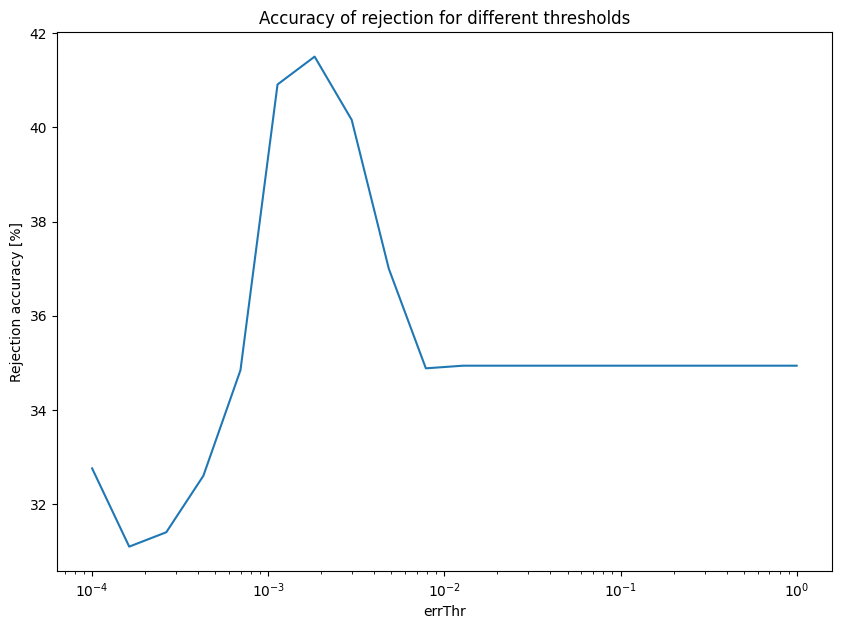

In [89]:
winSize = 9
numIter = 7
levelNum = 3
levelScale = 2
rejectionAccuracy = []
errThrSpace = np.logspace(-4,0,20,base=10)
lk_params = dict( winSize  = (5, 5),
                  maxLevel = 2,
                  criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 7, 0.3))
angleThreshold = 15
for errThr in errThrSpace :
    nRejected = 0
    nTrueRejected = 0
    canImg1 = cv2.imread(paths[0], cv2.IMREAD_GRAYSCALE) 
    p0 = cv2.goodFeaturesToTrack(canImg1,maxCorners=canImg1.size, qualityLevel=0.1,minDistance=3)
    keypoints = np.squeeze(p0).astype(np.int64)
    for path in paths[1:]:
        canImg2 = cv2.imread(path, cv2.IMREAD_GRAYSCALE)  
        flowVectors, validPoints = pyrLucasKanade(canImg1, canImg2, keypoints, winSize,numIter,levelNum,levelScale,errThr)
        p1, st, err = cv2.calcOpticalFlowPyrLK(canImg1, canImg2, p0, None, **lk_params)
        st = np.squeeze(st)
        trueFlowVectors = np.squeeze(p1-p0)
        flowVectorsAngles = np.arctan2(flowVectors[:,1],flowVectors[:,0])
        trueFlowVectorsAngles = np.arctan2(trueFlowVectors[:,1],trueFlowVectors[:,0])
        badFlow = np.abs(flowVectorsAngles-trueFlowVectorsAngles)>(angleThreshold)/180*np.pi
        if st.ndim == 0:
            st = np.atleast_1d(st)
        # Select good points
        if p1 is not None:
            good_new = p1[st==1]
        nRejected += np.sum(np.logical_not(validPoints))
        nTrueRejected += np.sum(badFlow[np.logical_not(validPoints)])
        p0 = good_new.reshape(-1, 1, 2)
        keypoints = good_new.reshape(-1, 2).astype(np.int64)
        canImg1 = canImg2
    rejectionAccuracy.append(nTrueRejected/nRejected * 100)
plt.plot(errThrSpace,rejectionAccuracy)
ax = plt.gca()
ax.set_xscale('log')
ax.set_xlabel('errThr')
ax.set_ylabel('Rejection accuracy [%]')
ax.set_title('Accuracy of rejection for different thresholds')
errThr = errThrSpace[np.argmax(rejectionAccuracy)]
print(f'Optimal threshold = {errThr}')

Text(0.5, 1.0, 'Frame: 13')

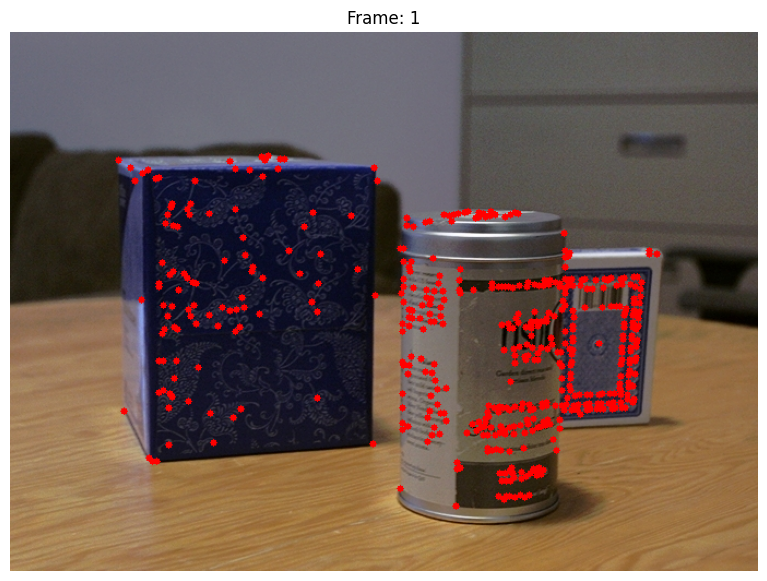

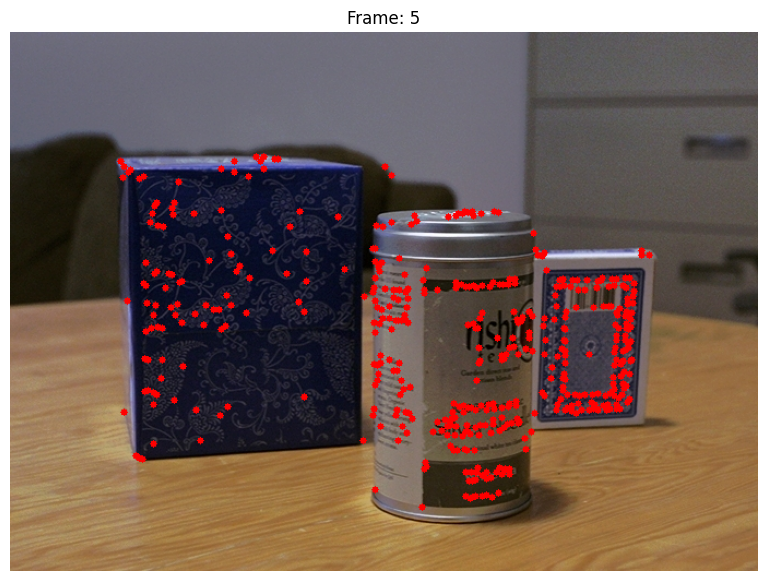

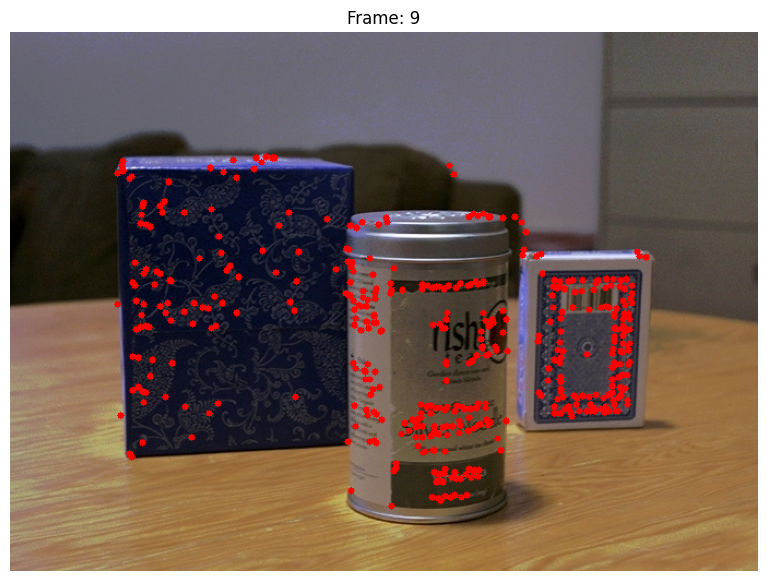

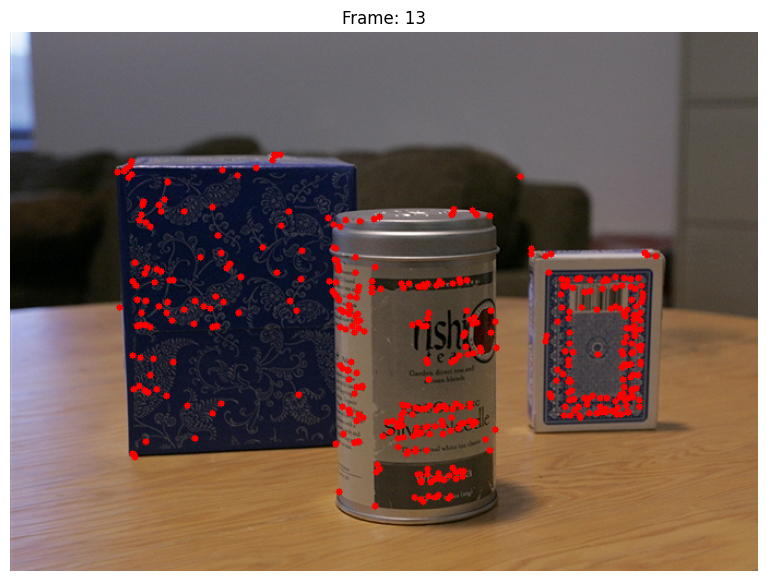

In [92]:
os.makedirs('CanLKpyr/',exist_ok=True)
canImg1 = cv2.imread(paths[0], cv2.IMREAD_GRAYSCALE)
keypoints = cv2.goodFeaturesToTrack(canImg1,maxCorners=canImg1.size, qualityLevel=0.1,minDistance=3)
keypoints = np.squeeze(keypoints).astype(np.int64)
initFlow = np.zeros_like(keypoints,np.float64)
for currentPath,nextPath in zip(paths[:-1],paths[1:]):
    savePath = os.path.join('CanLKpyr/',os.path.basename(currentPath))
    currentFrame = int(os.path.basename(currentPath)[5:7])
    canImg2 = cv2.imread(nextPath, cv2.IMREAD_GRAYSCALE)
    flowVectors, validPoints = pyrLucasKanade(canImg1, canImg2, keypoints, winSize,numIter,levelNum,levelScale,errThr)
    keypointImgRGB = cv2.cvtColor(cv2.imread(currentPath, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
    # keypointImgRGB = drawVectorFlow(keypointImgRGB, keypoints,flowVectors)
    keypointImgRGB = drawKeypoints(keypointImgRGB, keypoints)
    cv2.imwrite(savePath,cv2.cvtColor(keypointImgRGB, cv2.COLOR_RGB2BGR))
    if currentFrame in [1,5,9]:
        plt.figure()
        plt.imshow(keypointImgRGB)
        plt.axis("off")
        plt.title(f'Frame: {currentFrame}')
    # plt.imshow(keypointImgRGB)
    canImg1 = canImg2
    keypointImgRGB = cv2.cvtColor(cv2.imread(path, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
    keypoints = np.round(keypoints[validPoints] + flowVectors[validPoints]).astype(np.int64)
    initFlow = np.zeros_like(keypoints,np.float64)
currentFrame = int(os.path.basename(paths[-1])[5:7])
savePath = os.path.join('CanLKpyr/',os.path.basename(paths[-1]))
keypointImgRGB = cv2.cvtColor(cv2.imread(paths[-1], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
# keypointImgRGB = drawVectorFlow(keypointImgRGB, keypoints,flowVectors)
keypointImgRGB = drawKeypoints(keypointImgRGB, keypoints)
cv2.imwrite(savePath,cv2.cvtColor(keypointImgRGB, cv2.COLOR_RGB2BGR))
plt.figure()
plt.imshow(keypointImgRGB)
plt.axis("off")
plt.title(f'Frame: {currentFrame}')

In [ ]:
pathsMan
# os.makedirs('Man/',exist_ok=True)
winSize = 5
numIter = 7
levelNum = 2
levelScale = 2
errThr = 0.002
faceStart = np.array([60,40])
faceShape = (40,50)
faceEnd = (faceStart[0]+faceShape[0],faceStart[1]+faceShape[1])
video = cv2.VideoWriter('man_track.mp4', 0, 12, cv2.imread(currentPath, cv2.IMREAD_GRAYSCALE).shape[::-1])
lk_params = dict( winSize  = (5, 5),
                  maxLevel = 2,
                  criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 7, 0.3))

for currentPath,nextPath in zip(pathsMan[:-1],pathsMan[1:]):
    # savePath = os.path.join('CanLKpyr/',os.path.basename(currentPath))
    faceStartInt = np.round(faceStart).astype(np.int64)
    faceEndInt = np.round(faceEnd).astype(np.int64)
    currentFrame = int(os.path.basename(currentPath).split('.')[-2])
    manImg1 = cv2.imread(currentPath, cv2.IMREAD_GRAYSCALE)
    manImg1 = ((manImg1- manImg1.min())/(manImg1.max()-manImg1.min())*255).astype(np.uint8)
    manImg1Cropped = cv2.imread(currentPath, cv2.IMREAD_GRAYSCALE)[faceStartInt[1]:faceEndInt[1],faceStartInt[0]:faceEndInt[0]]
    manImg2 = cv2.imread(nextPath, cv2.IMREAD_GRAYSCALE)
    manImg2 = ((manImg2- manImg2.min())/(manImg2.max()-manImg2.min())*255).astype(np.uint8)
    # if (currentFrame-1) % 1 ==0 and currentFrame>20:
    #     fig, (ax_left,ax_right) = plt.subplots(1,2)
    #     ax_left.imshow(manImg1)
    #     ax_right.imshow(manImg2)
    #     plt.axis("off")
    #     plt.title(f'Frame: {currentFrame}')
    if (currentFrame-1) % 10 == 0 :
        p0 = cv2.goodFeaturesToTrack(manImg1Cropped,maxCorners=manImg1Cropped.size, qualityLevel=0.01,minDistance=1)
        p0 = (p0 + faceStart).astype(np.float32)
    keypoints = np.squeeze(p0).astype(np.int64)
    # flowVectors, validPoints = pyrLucasKanade(manImg1, manImg2, keypoints, winSize,numIter,levelNum,levelScale,errThr)
    p1, st, err = cv2.calcOpticalFlowPyrLK(manImg1, manImg2, p0, None, **lk_params)
    st = st.reshape(-1)
    flowVectors = (p1[st==1]-p0[st==1]).reshape(-1,2)

    # validPoints = st.reshape(-1).astype(bool)
    keypointImgRGB = cv2.cvtColor(cv2.imread(currentPath, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
    keypointImgRGB = cv2.rectangle(keypointImgRGB, faceStartInt, faceEndInt, (0,255,0), 1)
    keypointImgRGB = drawVectorFlow(keypointImgRGB, p0.reshape(-1,2),(p1-p0).reshape(-1,2),size=1,scaleFactor=3)
    # keypointImgRGB = drawKeypoints(keypointImgRGB, keypoints+ faceStart, size=1)
    keypointImgRGB = drawKeypoints(keypointImgRGB, p0.reshape(-1,2), size=1)
    video.write(cv2.cvtColor(keypointImgRGB, cv2.COLOR_RGB2BGR))
    # cv2.imwrite(savePath,cv2.cvtColor(keypointImgRGB, cv2.COLOR_RGB2BGR))

    # plt.imshow(keypointImgRGB)
    # canImg1 = canImg2
    # keypointImgRGB = cv2.cvtColor(cv2.imread(path, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
    # keypoints = np.round(keypoints[validPoints] + flowVectors[validPoints]).astype(np.int64)
    # p0 = keypoints.reshape(-1,1,2).astype(np.float32)
    # flowVectors = flowVectors[]
    # print(np.mean(flowVectors, axis=0))
    faceStart = faceStart + np.median(flowVectors, axis=0)
    # faceStart = faceStart.astype(np.int64)
    p0 = p1[st==1]
    goodP =[]
    for (x,y) in p0[:,0]:
        if x>faceStart[0] and x<faceEnd[0] and y>faceStart[1] and y<faceEnd[1]:
            goodP.append((x,y))
    p0 = np.array(goodP,dtype=np.float32).reshape(-1,1,2)
    print(currentFrame,np.mean(flowVectors, axis=0),faceStart)
    faceEnd = (faceStart[0]+faceShape[0],faceStart[1]+faceShape[1])
    if (currentFrame-1) % 10 ==0 and currentFrame>20:
        plt.figure()
        plt.imshow(keypointImgRGB)
        plt.axis("off")
        plt.title(f'Frame: {currentFrame}')
cv2.destroyAllWindows()
video.release()
# currentFrame = int(os.path.basename(paths[-1])[5:7])
# savePath = os.path.join('CanLKpyr/',os.path.basename(paths[-1]))
# keypointImgRGB = cv2.cvtColor(cv2.imread(paths[-1], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
# # keypointImgRGB = drawVectorFlow(keypointImgRGB, keypoints,flowVectors)
# keypointImgRGB = drawKeypoints(keypointImgRGB, keypoints)
# cv2.imwrite(savePath,cv2.cvtColor(keypointImgRGB, cv2.COLOR_RGB2BGR))
# plt.figure()
# plt.imshow(keypointImgRGB)
# plt.axis("off")
# plt.title(f'Frame: {currentFrame}')

In [125]:
# Optical flow parameters
winSize = 9
numIter = 7
levelNum = 3
levelScale = 2
errThr = 0.1
# Initial box position 
faceStart = np.array([65,45])
faceShape = np.array([35,45])
faceEnd = (faceStart[0]+faceShape[0],faceStart[1]+faceShape[1])
# Video recording objects
shape = cv2.imread(currentPath, cv2.IMREAD_GRAYSCALE).shape[::-1]
videoRect = cv2.VideoWriter('man_track.mp4', 0, 12,shape)
videoRectValid = cv2.VideoWriter('man_track_valid.mp4', 0, 12, shape)
videoRectValidFlow = cv2.VideoWriter('man_track_valid_flow.mp4', 0, 12, shape)

for currentPath,nextPath in zip(pathsMan[:-1],pathsMan[1:]):
    # Initialization of frames
    currentFrame = int(os.path.basename(currentPath).split('.')[-2])
    manImg1 = cv2.imread(currentPath, cv2.IMREAD_GRAYSCALE) 
    manImg2 = cv2.imread(nextPath, cv2.IMREAD_GRAYSCALE)
    faceStartInt = np.round(faceStart).astype(np.int64)
    faceEndInt = np.round(faceEnd).astype(np.int64)
    # Refresh keypoints
    if (currentFrame-1) % 20 == 0 :
        manImg1Cropped = manImg1[faceStartInt[1]:faceEndInt[1],faceStartInt[0]:faceEndInt[0]]
        keypoints = cv2.goodFeaturesToTrack(manImg1Cropped,maxCorners=manImg1Cropped.size, qualityLevel=0.1,minDistance=3)
        keypoints = np.squeeze(keypoints + faceStart).astype(np.int64)
    # Optical flow  
    flowVectors, validPoints = pyrLucasKanade(manImg1, manImg2, keypoints, winSize,numIter,levelNum,levelScale,errThr)
    # Draw box, keypoints and optical flow
    imgRGB = cv2.cvtColor(cv2.imread(currentPath, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
    imgRGB = cv2.rectangle(imgRGB, faceStartInt, faceEndInt, (0,255,0), 1)
    videoRect.write(cv2.cvtColor(imgRGB, cv2.COLOR_RGB2BGR))
    imgRGB = drawKeypoints(imgRGB, keypoints, size=1)
    videoRectValid.write(cv2.cvtColor(imgRGB, cv2.COLOR_RGB2BGR))
    imgRGB = drawVectorFlow(imgRGB, keypoints,flowVectors,size=1,scaleFactor=3)
    videoRectValidFlow.write(cv2.cvtColor(imgRGB, cv2.COLOR_RGB2BGR))
    # Iteratively remove keypoints out of scope and average valid movement for the updated position
    changeFlag = True
    while changeFlag:
        faceStartCandidate = faceStart + np.mean(flowVectors[validPoints], axis=0)
        faceEndCandidate = faceStartCandidate + faceShape
        changeFlag = False
        for i, (x,y) in enumerate(keypoints):
            if x<faceStartCandidate[0] or x>faceEndCandidate[0] or y<faceStartCandidate[1] or y>faceEndCandidate[1]:
                if validPoints[i]:
                    validPoints[i] = False
                    changeFlag = True
    # Update box position and valid keypoints            
    faceStart = faceStartCandidate
    faceEnd = faceEndCandidate
    keypoints =  np.round(keypoints[validPoints] + flowVectors[validPoints]).astype(np.int64)
# Save videos
cv2.destroyAllWindows()
videoRect.release()
videoRectValid.release()
videoRectValidFlow.release()
